In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys 
sys.path.append('../')

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"] = ""

In [4]:
import os
import tensorflow 
import numpy as np
import random


seed_value = 42
#seed_value = None

environment_name = sys.executable.split('/')[-3]
print('Environment:', environment_name)
os.environ[environment_name] = str(seed_value)

np.random.seed(seed_value)
random.seed(seed_value)
tensorflow.random.set_seed(seed_value)

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
import tensorflow.compat.v1.keras.backend as K
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
K.set_session(session)

tensorflow.__version__

Environment: biotmpygpu


'2.2.0'

In [20]:
#multiple_gpus=[0,1,2,3]
#multiple_gpus=None

In [5]:
# import os
# import tensorflow as tf
# print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# if multiple_gpus:
#     devices = []
#     for gpu in multiple_gpus:
#         devices.append('/gpu:' + str(gpu))    
#     strategy = tensorflow.distribute.MirroredStrategy(devices=devices)
# # Get the GPU device name.
# else:
#     device_name = tensorflow.test.gpu_device_name()
#     # The device name should look like the following:
#     if device_name == '/device:GPU:0':
#         print('Found GPU at: {}'.format(device_name))
#     else:
#         raise SystemError('GPU device not found')

#     os.environ["CUDA_VISIBLE_DEVICES"] = device_name
#     os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
    
    
from wrappers.bioc_wrapper import bioc_to_docs, bioc_to_relevances
from wrappers.pandas_wrapper import relevances_to_pandas, docs_to_pandasdocs
from preprocessing.dl import DL_preprocessing
from mlearning.dl_models import Burns_CNN, Burns_LSTM, Chollet_DNN, DNN, Burns_CNN2, Burns_BiLSTM, Burns_CNN3, Burns_CNNBiLSTM
from mlearning.dl_models import DeepDTA
from preprocessing.embeddings import compute_embedding_matrix, glove_embeddings_2
from mlearning.ml import serialize_config, deserialize_config
from preprocessing.dl import average_precision
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score, matthews_corrcoef
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from preprocessing.dl_config import DLConfig
from tensorflow.keras.preprocessing import text
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
from nltk.corpus import stopwords
import seaborn as sns
from openpyxl import load_workbook
import pandas as pd
import os
from keras import backend as K
import pickle
from preprocessing.dl import Bert_preprocessing
#from tfdeterminism import patch
#patch()

[nltk_data] Downloading package stopwords to /home/malves/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/malves/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /home/malves/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [6]:
dl_config = DLConfig()
dl_config = dl_config.load('models/biobert_lstm_ft/biobert_lstm_ft_28/config.txt')

ModuleNotFoundError: No module named 'mlearning.dl_config'

In [23]:
from mlearning.dl_models import Bert_Dense_opt, Bert_LSTM_opt, Bert_CLS_opt

In [9]:
biobert_path = './biobert_v1.1_pubmed'
# if multiple_gpus:
#     with strategy.scope():
#         #model = Bert_FT(dl_config, learning_rate=dl_config.learning_rate, bert_name_or_path=biobert_path, bert_config=True)
#         model = Bert_LSTM_opt(dl_config, learning_rate=dl_config.learning_rate,static_bert=False, bert_name_or_path=biobert_path, bert_config=True)

#else:
    #model = Bert_FT(dl_config, learning_rate=dl_config.learning_rate, bert_name_or_path=biobert_path, bert_config=True)
model = Bert_LSTM_opt(dl_config, learning_rate=dl_config.learning_rate,static_bert=False, bert_name_or_path=biobert_path, bert_config=True)

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the PyTorch model TFBertModel were not initialized from the TF 2.0 model and are newly initialized: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'bert.embeddings.position_ids', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_idx (InputLayer)          [(None, 512)]        0                                            
__________________________________________________________________________________________________
input_masks (InputLayer)        [(None, 512)]        0                                            
__________________________________________________________________________________________________
input_segments (InputLayer)     [(None, 512)]        0                                            
__________________________________________________________________________________________________
tf_bert_model (TFBertModel)     ((None, 512, 768), ( 108310272   input_idx[0][0]                  
                                                                 input_masks[0][0]            

In [10]:
model.load_weights('models/biobert_lstm_ft/biobert_lstm_ft_28/model_weights.h5')

In [11]:
test_dataset_path = '../datasets/PMtask_Triage_TestSet.xml'

docs_test = bioc_to_docs(test_dataset_path, dl_config=dl_config)
relevances_test = bioc_to_relevances(test_dataset_path, 'protein-protein')

x_test_df = docs_to_pandasdocs(docs_test)
y_test_df = relevances_to_pandas(x_test_df, relevances_test)

x_test, y_test = Bert_preprocessing(x_test_df, y_test_df, dl_config=dl_config)

In [12]:
yhat_probs = model.predict(x_test, verbose=0)
yhat_probs = yhat_probs[:, 0]

yhat_classes = np.where(yhat_probs > 0.5, 1, yhat_probs)
yhat_classes = np.where(yhat_classes < 0.5, 0, yhat_classes).astype(np.int64)

In [13]:
x_set=x_test_df
padding = dl_config.padding
truncating = dl_config.truncating

tokenized_docs = []
for doc in x_set['Document']:
    marked_text = "[CLS] " + doc.fulltext_string + " [SEP]"


    tokenized_docs.append(dl_config.tokenizer.tokenize(marked_text))


indexed_docs = []
for doc in tokenized_docs:
    indexed_docs.append(dl_config.tokenizer.convert_tokens_to_ids(doc))

In [17]:
indexed_docs

[[101,
  1693,
  118,
  5880,
  3923,
  15355,
  118,
  9618,
  21177,
  6412,
  1107,
  11631,
  3575,
  131,
  185,
  7111,
  1918,
  12241,
  117,
  3735,
  117,
  1105,
  27555,
  5239,
  119,
  1130,
  11631,
  3575,
  117,
  1344,
  118,
  5880,
  3923,
  140,
  1161,
  1477,
  116,
  118,
  9618,
  148,
  116,
  113,
  139,
  2428,
  114,
  6412,
  1132,
  9271,
  1106,
  170,
  21501,
  1116,
  1105,
  9071,
  20618,
  164,
  148,
  1605,
  1361,
  117,
  145,
  119,
  144,
  119,
  117,
  3084,
  2393,
  119,
  113,
  1820,
  114,
  147,
  119,
  151,
  8816,
  2155,
  6617,
  119,
  1479,
  117,
  4573,
  1571,
  118,
  5306,
  1495,
  166,
  117,
  1133,
  7846,
  3001,
  1104,
  1147,
  2918,
  2838,
  1105,
  27555,
  5239,
  1138,
  1136,
  1870,
  1151,
  3106,
  1628,
  119,
  1706,
  8242,
  1292,
  2492,
  117,
  1126,
  146,
  1830,
  1942,
  3190,
  26116,
  113,
  164,
  8347,
  2240,
  166,
  146,
  1830,
  1942,
  3190,
  118,
  141,
  16382,
  3663,
  120,
  162

In [18]:
indexed_docs
tk_fp = 0
tk_fp_2 = []
for index in indexed_docs:
    if len(indexed_docs[index]) > 512:
        tk_fp +=1
    tk_fp_2.append(indexed_docs[index])



TypeError: list indices must be integers or slices, not list

In [ ]:
tk_fn = 0
tk_fn_2 = []
for index in fn:
    if len(indexed_docs[index]) > 512:
        tk_fn +=1
    tk_fn_2.append(indexed_docs[index])

In [ ]:
tk_tp = 0
tk_tp_2 = []
for index in tp:
    if len(indexed_docs[index]) > 512:
        tk_tp +=1
    tk_tp_2.append(indexed_docs[index])

In [ ]:
tk_tn = 0
tk_tn_2 = []
for index in tn:
    if len(indexed_docs[index]) > 512:
        tk_tn +=1
    tk_tn_2.append(indexed_docs[index])

In [ ]:
print(tk_tn/len(tk_tn_2)*100)

In [ ]:
print(tk_tp/len(tk_tp_2)*100)

In [ ]:
print(tk_fp/len(tk_fp_2)*100)

In [ ]:
print(tk_fn/len(tk_fn_2)*100)

In [ ]:

fn = []
fp = []
tp=[]
tn=[]
c1 = 0
c2 = 0
c3 = 0
for i in range(len(y_test)):
    if y_test[i] == 0 and yhat_classes[i]== 1:
        fp.append(i)
        c1 += 1
    elif y_test[i] == 1 and yhat_classes[i]==0:
        fn.append(i)
        c2 +=1
    elif y_test[i] == 1 and yhat_classes[i]==1:
        tp.append(i)
    elif y_test[i] == 0 and yhat_classes[i]==0:
        tn.append(i)
        
print(c1, c2)

In [18]:
x = np.array([0.7978142076502732, 0.828496042216359, 0.7777777777777778, 0.7752808988764044, 0.7717391304347826, 0.7777777777777777, 0.765840220385675, 0.755813953488372, 0.7235294117647059, 0.7235294117647059])

In [19]:
x_test_fp = x_test[0][fp, :]
fp_docs = []
for doc in x_test_fp:
    fp_docs.append(dl_config.tokenizer.convert_ids_to_tokens(doc, skip_special_tokens =True))

In [20]:
x_test_fn = x_test[0][fn, :]
fn_docs = []
for doc in x_test_fn:
    fn_docs.append(dl_config.tokenizer.convert_ids_to_tokens(doc, skip_special_tokens =True))

In [21]:
x_test_tp = x_test[0][tp, :]
tp_docs = []
for doc in x_test_tp:
    tp_docs.append(dl_config.tokenizer.convert_ids_to_tokens(doc, skip_special_tokens =True))

In [22]:
x_test_tn = x_test[0][tn, :]
tn_docs = []
for doc in x_test_tn:
    tn_docs.append(dl_config.tokenizer.convert_ids_to_tokens(doc, skip_special_tokens =True))

In [23]:
def docs_to_tokens(l):
    tokens = []
    for doc in l:
        s = ''
        for i, word in enumerate(doc):
            if i == 0:
                s+=word
            elif '##' in word:
                s+=word[2:]
            elif i == len(fn_docs[0]):
                s = s+ ' ' + word
            else: 
                s = s+ ' ' + word
        tokens.extend(nltk.word_tokenize(s))
    return tokens

In [24]:
fp_nmr_tokens = 0
for doc in fp_docs:
    for t in doc:
        fp_nmr_tokens+=1

In [25]:
fn_nmr_tokens = 0
for doc in fn_docs:
    for t in doc:
        fn_nmr_tokens+=1

In [26]:
tp_nmr_tokens = 0
for doc in tp_docs:
    for t in doc:
        tp_nmr_tokens+=1

In [27]:
tn_nmr_tokens = 0
for doc in tn_docs:
    for t in doc:
        tn_nmr_tokens+=1

In [28]:
print('fp: ', fp_nmr_tokens)
print('fn: ', fn_nmr_tokens)
print('tp: ', tp_nmr_tokens)
print('tn: ', tn_nmr_tokens)

fp:  123682
fn:  63075
tp:  246986
tn:  192123


In [29]:
fp_tokens = docs_to_tokens(fp_docs)
fn_tokens = docs_to_tokens(fn_docs)
tp_tokens = docs_to_tokens(tp_docs)
tn_tokens = docs_to_tokens(tn_docs)

In [33]:
stop_words = set(stopwords.words('english'))

In [34]:
new_fp = []
for t in fp_tokens:
    if t.lower() not in stop_words:
        new_fp.append(t)

In [35]:
new_fn = []
for t in fn_tokens:
    if t.lower() not in stop_words:
        new_fn.append(t)

In [36]:
new_tn = []
for t in tn_tokens:
    if t.lower() not in stop_words:
        new_tn.append(t)

In [37]:
new_tp = []
for t in tp_tokens:
    if t.lower() not in stop_words:
        new_tp.append(t)

In [38]:
from collections import Counter 
fp_counter = Counter(new_fp) 
fn_counter = Counter(new_fn) 
tn_counter = Counter(new_tn) 
tp_counter = Counter(new_tp) 

In [39]:
fp_mc = fp_counter.most_common()
new_fp_mc = []
for x in range(len(fp_mc)):
    tok_1 = fp_mc[x][0]
    tok_2 = fp_mc[x][1]
    tok_2 = tok_2 *100/fp_nmr_tokens
    new_fp_mc.append((tok_1, tok_2))
new_fp_mc

[('-', 3.2745266085606635),
 ('.', 2.4433628175482287),
 (',', 2.354425057809544),
 (')', 1.3041509678045309),
 ('(', 1.291214566387995),
 ('protein', 0.44388027360488996),
 ('binding', 0.43902912307368896),
 ('/', 0.3250270855904659),
 ('receptor', 0.3104736339968629),
 ('cells', 0.297537232580327),
 ('mutant', 0.281366730809657),
 ('1', 0.2676218043045876),
 ('domain', 0.24498310182564964),
 ('kinase', 0.22234439934671174),
 ('2', 0.20455684739897478),
 ('activity', 0.2037483223104413),
 ('activation', 0.18919487071683835),
 ('3', 0.17949256965443638),
 ('type', 0.17868404456590287),
 ('phosphorylation', 0.16251354279523295),
 ('interaction', 0.15119419155576397),
 ('mutation', 0.149577141378697),
 ('site', 0.149577141378697),
 ('cell', 0.144725990847496),
 ('alpha', 0.143108940670429),
 ('wild', 0.13987484031629502),
 ('DNA', 0.13421516469656053),
 ('proteins', 0.13259811451949355),
 ('p53', 0.13259811451949355),
 ('complex', 0.13017253925389305),
 ('mutations', 0.12936401416535956)

In [40]:
new_fp_mc[36]

('terminal', 0.1140020374832231)

In [57]:

fp_ind = [5,6,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
#fp_ind = [5,6,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26, 27, 28, 29, 30, 31, 33,34,35,36,37,38,39,40,41,42,43,44,45,46 ]
fp_words=[]
fp_perc =[]
for i in fp_ind:
    fp_words.append(new_fp_mc[i][0])
    fp_perc.append(new_fp_mc[i][1])


In [58]:
fn_mc = fn_counter.most_common()
new_fn_mc = []
for x in range(len(fn_mc)):
    tok_1 = fn_mc[x][0]
    tok_2 = fn_mc[x][1]
    tok_2 = tok_2 *100/fn_nmr_tokens
    new_fn_mc.append((tok_1, tok_2))
new_fn_mc
    

[('-', 3.4562029330162507),
 ('.', 2.4510503369005154),
 (',', 2.4240982956797463),
 ('(', 1.3127229488703924),
 (')', 1.3111375346809353),
 ('protein', 0.5152596115735236),
 ('/', 0.4518430439952438),
 ('kinase', 0.4391597304795878),
 ('phosphorylation', 0.4328180737217598),
 ('cells', 0.34720570749108204),
 ('1', 0.31866825208085614),
 ('p53', 0.2901307966706302),
 ('2', 0.2473246135552913),
 ('cell', 0.22988505747126436),
 ('binding', 0.20610384462940942),
 ('proteins', 0.19817677368212447),
 ('3', 0.18549346016646848),
 ('activity', 0.17756638921918352),
 ('domain', 0.1759809750297265),
 ('mutant', 0.17439556084026953),
 ('activation', 0.16805390408244153),
 ('receptor', 0.16329766151407055),
 ('induced', 0.15695600475624258),
 ('phosphorylated', 0.15695600475624258),
 ('tyrosine', 0.15061434799841458),
 ('dependent', 0.14110186286167262),
 ('terminal', 0.12049147839873167),
 ('factor', 0.12049147839873167),
 ('Ser', 0.11890606420927467),
 ('C', 0.11732065001981767),
 ('serine', 0.

In [59]:
new_fn_mc[35]

('expression', 0.10622275069361871)

In [60]:
fn_ind = [5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
#fn_ind = [5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45]

fn_words=[]
fn_perc =[]
for i in fn_ind:
    fn_words.append(new_fn_mc[i][0])
    fn_perc.append(new_fn_mc[i][1])



In [61]:
tp_mc = tp_counter.most_common()
new_tp_mc = []
for x in range(len(tp_mc)):
    tok_1 = tp_mc[x][0]
    tok_2 = tp_mc[x][1]
    tok_2 = tok_2 *100/tp_nmr_tokens
    new_tp_mc.append((tok_1, tok_2))
new_tp_mc
    

[('-', 3.547569497866276),
 ('.', 2.48678062724203),
 (',', 2.4305021337241786),
 (')', 1.3575668256500368),
 ('(', 1.357161944401707),
 ('binding', 0.49597952920408445),
 ('protein', 0.422291142008049),
 ('1', 0.3433392985837254),
 ('/', 0.3388856048520969),
 ('domain', 0.30973415497234663),
 ('receptor', 0.30487557999238823),
 ('interaction', 0.27005579263601986),
 ('cells', 0.2680313863943705),
 ('kinase', 0.24819220522620716),
 ('3', 0.22754326156138405),
 ('2', 0.21742123035313743),
 ('phosphorylation', 0.19960645542662336),
 ('activity', 0.1967722866883143),
 ('mutant', 0.1866502554800677),
 ('cell', 0.1749086992785016),
 ('proteins', 0.1716696492918627),
 ('C', 0.16843059930522378),
 ('alpha', 0.16519154931858485),
 ('mutation', 0.16154761808361606),
 ('type', 0.16073785558695636),
 ('residues', 0.14980606188205),
 ('mutations', 0.14413772440543188),
 ('terminal', 0.1417084369154527),
 ('activation', 0.13968403067380336),
 ('p53', 0.128752236968897),
 ('tyrosine', 0.123893661988

In [62]:
new_tp_mc[35]

('dependent', 0.11093746204238297)

In [63]:
tp_ind = [5,6,7,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
#tp_ind = [5,6,7,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45]
tp_words=[]
tp_perc =[]
for i in tp_ind:
    tp_words.append(new_tp_mc[i][0])
    tp_perc.append(new_tp_mc[i][1])

new_tp_mc

[('-', 3.547569497866276),
 ('.', 2.48678062724203),
 (',', 2.4305021337241786),
 (')', 1.3575668256500368),
 ('(', 1.357161944401707),
 ('binding', 0.49597952920408445),
 ('protein', 0.422291142008049),
 ('1', 0.3433392985837254),
 ('/', 0.3388856048520969),
 ('domain', 0.30973415497234663),
 ('receptor', 0.30487557999238823),
 ('interaction', 0.27005579263601986),
 ('cells', 0.2680313863943705),
 ('kinase', 0.24819220522620716),
 ('3', 0.22754326156138405),
 ('2', 0.21742123035313743),
 ('phosphorylation', 0.19960645542662336),
 ('activity', 0.1967722866883143),
 ('mutant', 0.1866502554800677),
 ('cell', 0.1749086992785016),
 ('proteins', 0.1716696492918627),
 ('C', 0.16843059930522378),
 ('alpha', 0.16519154931858485),
 ('mutation', 0.16154761808361606),
 ('type', 0.16073785558695636),
 ('residues', 0.14980606188205),
 ('mutations', 0.14413772440543188),
 ('terminal', 0.1417084369154527),
 ('activation', 0.13968403067380336),
 ('p53', 0.128752236968897),
 ('tyrosine', 0.123893661988

In [64]:
tn_mc = tn_counter.most_common()
new_tn_mc = []
for x in range(len(tn_mc)):
    tok_1 = tn_mc[x][0]
    tok_2 = tn_mc[x][1]
    tok_2 = tok_2 *100/tn_nmr_tokens
    new_tn_mc.append((tok_1, tok_2))
new_tn_mc
    

[('-', 3.45820125648673),
 ('.', 2.466128469782379),
 (',', 2.4166809804135894),
 ('(', 1.3106187182169755),
 (')', 1.309057218552698),
 ('protein', 0.4523144027524034),
 ('/', 0.4216049093549445),
 ('cells', 0.3851699171884678),
 ('1', 0.3221894307292724),
 ('kinase', 0.31073843319123684),
 ('cell', 0.2659754428152798),
 ('2', 0.2503604461725041),
 ('p53', 0.24255294785111622),
 ('binding', 0.24151194807493118),
 ('phosphorylation', 0.24151194807493118),
 ('activation', 0.22173295232741524),
 ('receptor', 0.21808945311076758),
 ('3', 0.19102345892995634),
 ('activity', 0.18842095948949372),
 ('mutant', 0.1686419637419778),
 ('proteins', 0.1577114660920348),
 ('factor', 0.1493834678825544),
 ('induced', 0.14834246810636936),
 ('expression', 0.1446989688897217),
 ('signaling', 0.1379324703445189),
 ('dependent', 0.13480947101596374),
 ('domain', 0.1337684712397787),
 ('type', 0.12960447213503848),
 ('growth', 0.12856347235885343),
 ('mediated', 0.12283797358983568),
 ('alpha', 0.1165919

In [65]:
new_tn_mc[35]

('human', 0.10409997761850481)

In [66]:
tn_ind = [5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
#tn_ind = [5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25, 26,27,28,29,30,31,32,33,34,35,36,37,38,40,42,43,44,45,46,47,48]
tn_words=[]
tn_perc =[]
for i in tn_ind:
    tn_words.append(new_tn_mc[i][0])
    tn_perc.append(new_tn_mc[i][1])



In [67]:
fp_words.index('protein')

0

In [68]:
import bokeh

In [69]:
p = sns.color_palette("Paired")
p.extend(sns.color_palette("Set2"))


In [70]:
#p.extend(sns.color_palette("tab10"))

In [71]:
#p.extend(sns.color_palette("deep"))

p53
induced
dependent
interaction
alpha
mutation
type


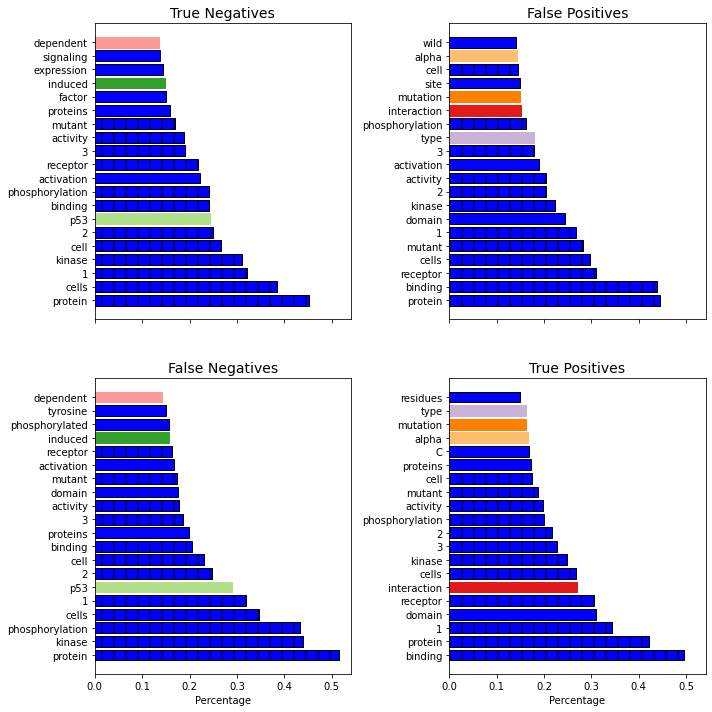

In [80]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10,10), sharex=True)
#fig.suptitle('Top 20 words of the 4 subsets from the test set', fontsize=15)

barlist1 = ax1.barh(tn_words, tn_perc, color='b', edgecolor='black')
barlist2 = ax2.barh(fp_words, fp_perc, color='b', edgecolor='black')
barlist3 = ax3.barh(fn_words, fn_perc, color='b', edgecolor='black')
barlist4 = ax4.barh(tp_words, tp_perc, color='b', edgecolor='black')
ids = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]

i = 0
for word in tn_words:
    if word in fn_words and word in tn_words and word not in tp_words and word not in fp_words:
        barlist1[tn_words.index(word)].set_color(p[i+2])
        barlist3[fn_words.index(word)].set_color(p[i+2])
        print(word)
        i+=1
        
for word in tp_words:
    if word in tp_words and word in fp_words and word not in fn_words and word not in tn_words:
        print(word)
        barlist2[fp_words.index(word)].set_color(p[i+2])
        barlist4[tp_words.index(word)].set_color(p[i+2])
        i+=1
        
patterns = [ "/" , "\\" , "|" , "-" , "+" ]

i = 0
for word in tp_words:
    if word in tp_words and word in fp_words and word in fn_words and word  in tn_words:
        if i > 4:
            i = 0
        barlist2[fp_words.index(word)].set_hatch(patterns[2])
        barlist4[tp_words.index(word)].set_hatch(patterns[2])
        barlist1[tn_words.index(word)].set_hatch(patterns[2])
        barlist3[fn_words.index(word)].set_hatch(patterns[2])
        i+=1

ax1.set_title('True Negatives', fontsize=14)
ax2.set_title('False Positives', fontsize=14)
ax3.set_title('False Negatives', fontsize=14)
ax4.set_title('True Positives', fontsize=14)


ax3.set_xlabel('Percentage')
ax4.set_xlabel('Percentage')

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
# ax0.set_facecolor('aliceblue')
# ax1.set_facecolor('honeydew')
# ax0.set_xlabel('counts')
# ax1.set_xlabel('counts')
plt.savefig('eval_words.pdf')
plt.show()

In [14]:
# accuracy: (tp + tn) / (p + n)
avg_prec  = average_precision(y_test_df, yhat_probs)
print('Average Precision: %f' % avg_prec)

accuracy = accuracy_score(y_test, yhat_classes)
print('Accuracy: %f' % accuracy)

# precision tp / (tp + fp)
precision = precision_score(y_test, yhat_classes)
print('Precision: %f' % precision)

# recall: tp / (tp + fn)
recall = recall_score(y_test, yhat_classes)
print('Recall: %f' % recall)

# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, yhat_classes)
print('F1 score: %f' % f1)

# kappa
kappa = cohen_kappa_score(y_test, yhat_classes)
print('Cohens kappa: %f' % kappa)
# ROC AUC
auc = roc_auc_score(y_test, yhat_probs)
print('ROC AUC: %f' % auc)

mcc = matthews_corrcoef(y_test, yhat_classes)
print('MCC: %f' % mcc)

# confusion matrix
matrix = confusion_matrix(y_test, yhat_classes)
print(matrix)


tn, fp, fn, tp = confusion_matrix(y_test, yhat_classes).ravel()

Average Precision: 0.788310
Accuracy: 0.697968
Precision: 0.661157
Recall: 0.795455
F1 score: 0.722115
Cohens kappa: 0.397437
ROC AUC: 0.781423
MCC: 0.405626
[[436 287]
 [144 560]]


In [15]:
yhat_probs_copy = yhat_probs.copy()
yhat_probs_df = pd.Series(data=yhat_probs_copy.reshape(1427,), index=y_test_df.index)
yhat_probs_df[yhat_probs_df < 0.50] = - (1 - yhat_probs_df)
sorted_yhat = yhat_probs_df.sort_values(ascending=False)
ranked_df = sorted_yhat.to_frame().rename(columns={0: 'Conf. Score'})
data = {'PMID':[],'URL':[]}
for index in ranked_df.index.values:
    doc_title = x_test_df['Document'][index].raw_title
    data['PMID'].append(index)
    data['URL'].append('<a href="https://pubmed.ncbi.nlm.nih.gov/{0}/">{1}</a>'.format(index, doc_title))
meta_df = pd.DataFrame(data, index= ranked_df.index)

final_df = meta_df.join(ranked_df)
final_df
import pickle
with open('final_df.txt', 'wb') as f:
    pickle.dump(final_df, f)

In [18]:
from IPython.core.display import display, HTML
display(HTML(final_df.to_html(escape=False, index=False)))

PMID,URL,Conf. Score
9791008,The use of the yeast two hybrid system to evaluate ErbB-3 interactions with SH2 domain containing proteins.,0.935013
16949543,Multiple co-activator complexes support ligand-induced transactivation function of VDR.,0.932255
10713702,Dimerization of the amino terminal domain of p57Kip2 inhibits cyclin D1-cdk4 kinase activity.,0.931436
10037723,The interaction of the human MutL homologues in hereditary nonpolyposis colon cancer.,0.929478
17689488,A Sveinsson's chorioretinal atrophy-associated missense mutation in mouse Tead1 affects its interaction with the co-factors YAP and TAZ.,0.927096
8084002,Functional importance of complex formation between the retinoblastoma tumor suppressor family and adenovirus E1A proteins as determined by mutational analysis of E1A conserved region 2.,0.927068
8437840,Alanine mutagenesis of conserved residues in the platelet-derived growth factor family: identification of residues necessary for dimerization and transformation.,0.926036
23897824,SHANK3 gene mutations associated with autism facilitate ligand binding to the Shank3 ankyrin repeat region.,0.925661
9368069,Discrimination of amino acids mediating Ras binding from noninteracting residues affecting raf activation by double mutant analysis.,0.923816
9131587,A genetic approach to mapping the p53 binding site in the MDM2 protein.,0.923546
